# **Maestría en Inteligencia Artificial Aplicada**
## **Curso: Inteligencia Artificial y Aprendizaje Automático**
#### Tecnológico de Monterrey
#### Prof Luis Eduardo Falcón Morales

### **Semana: Autoencoders y Técnicas de Conglomerados (Clustering)**

# **Introducción**

#### Sabemos que kMeans es un método de clasificación (clustering) no supervisado que nos ayuda a encontrar subgrupos de datos similares dentro de un conjunto de datos. Veamos ahora el efecto que puedan tener diferentes técnicas de reducción de dimensionalidad, Autoencoders y PCA, en la calidad de dichos subgrupos.

La página inicial de Kaggle de donde proceden dichos datos se desactualizó, pero mientras la acutalizan, el archivo de los datos estará en Canvas.

El archivo consta de 15,000 registros con 9 factores para un problema de ambiente de trabajo en una organización (entre ellos el problema de rotación de personal como ya estudiamos en semanas anteriores) con variables numéricas y categóricas.

La idea es usar técnicas de Autoencoders y PCA, en combinación con el método de KMeans, para encontrar subgrupos o cúmulos de personas que nos den información sobre el ambiente de trabajo dentro de dicha organización.

Las técnicas que aplicaremos son técnicas no supervisadas, ya que no tenemos la información en relación a un problema de clasificación o regresión.



Así, usaremos técnicas de reducción de dimensionalidad para identificar subgrupos similares de empleados a través de información proporcionada por el archivo proveniente de recursos humanos. Primero vamos a identificar los subgrupos y después vamos predecir qué datos están en cada subgrupo.

Para entender lo que nos dicen dichos subgrupos desde un punto de vista de negocio, necesitamos analizar dichos subrupos con respecto a los factores iniciales. Es decir, ¿qué tienen en común los empleados que están en un mismo subgrupo?

Recuerda que la manera en que funciona el método del codo (elbow method) para seleccionar el mejor número de subrupos en la técnica de kMeans, es buscando la cantidad de cúmulos que nos lleve a la suma más baja de distancias al cuadrado (llamada "inercia"), es decir, donde la inercia no sufra cambios importantes al seguir aumentando la cantidad de cúmulos.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

import tensorflow as tf
from keras.layers import Input, Dense
from keras.models import Model, load_model

from keras.optimizers import SGD

from sklearn.preprocessing import OrdinalEncoder

# comentemos por el momento los posibles Warnings:
from warnings import filterwarnings
filterwarnings('ignore')

# **Funciones para gráficas de la última parte de esta atcividad.**

In [ ]:
# Esta celda contiene las funciones para generar varios de los
# gráficos que requeriremos en esta actividad.

# Definimos la función de gráficos con datos numéricos:

def mi_scatterplotPCAEncoder(perfil_Zencoder, perfil_pca, fact1, fact2):

  plt.figure(figsize=(15,10))
  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))

  sns.scatterplot(data=perfil_Zencoder,
                  x= fact1,
                  y= fact2,
                  hue='autoencoder_clusters',
                  s=85,
                  alpha=0.4,
                  palette='bright',
                  ax=ax1
                  ).set_title('(AutoEncoder) Cúmulos',fontsize=18)

  sns.scatterplot(data=perfil_pca,
                  x=fact1,
                  y=fact2,
                  hue='pca_clusters',
                  s=85,
                  alpha=0.6,
                  palette='bright'
                  ).set_title('(PCA) Cúmulos',fontsize=18)



# Definimos la función de gráficos con variables categóricas:

def mi_catplotPCAEncoder(perfil_Zencoder, perfil_pca, fact1, fact2):

  plt.figure(figsize=(15,10))
  fig = plt.subplots(1,2, figsize=(20,15))

  ax1 = sns.catplot(data=perfil_Zencoder,
                    x= fact1,
                    y= fact2,
                    hue='autoencoder_clusters',
                    jitter=0.6,
                    s=20,
                    alpha=0.6,
                    palette='bright',
                    legend_out=True
                    )

  ax2 = sns.catplot(data=perfil_pca,
                    x=fact1,
                    y=fact2,
                    hue='pca_clusters',
                    jitter=0.6,
                    s=20,
                    alpha=0.6,
                    palette='bright',
                    legend_out=True
                    )

  ax1.fig.suptitle('(AutoEncoder) Cúmulos', fontsize=16,)
  ax2.fig.suptitle('(PCA) Cúmulos', fontsize=16)
  plt.close(1)
  plt.close(2)

# **Cargando la información**

In [ ]:
# Cargamos los datos:

data = pd.read_csv("hr_autoencoders.csv",sep=',',header='infer')
print(data.shape)
data.head().T

(15000, 9)


,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


La información sobre cada variable es la siguiente:

*   #### **satisfaction_level:** Nivel de satisfacción del empleado dentro de la organización en la última encuesta realizda. Escala de 0 a 1, donde 1 es lo mejor.

*   #### **last_evaluation:** Calificación del desempeño del empleado en la última evaluación realizada por la empresa. Escala de 0 a 1, donde 1 es lo mejor.

*   #### **number_project:** Número promedio de proyectos en los que usualmente está involucrado dentro de la empresa.

*   #### **average_montly_hours:** Horas mensuales promedio de trabajo en la empresa.

*   #### **time_spend_company:** Cantidad de años dentro de la empresa.

*   #### **Work_accident:** Si ha tenido (1) o no (0) un accidente dentro de la empresa.

*   #### **promotion_last_5years:** Si ha sido promovido (1) o no (0) dentro de la empresa en los últimos 5 años.

*   #### **sales:** Área a la que pertenece dentro de la empresa: sales, technical, support, IT, product_mng, marketing, RandD, accounting, hr, management.

*   #### **salary:** Nivel de salario del empleado: low, medium, high.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     15000 non-null  float64
 1   last_evaluation        15000 non-null  float64
 2   number_project         15000 non-null  int64  
 3   average_montly_hours   15000 non-null  int64  
 4   time_spend_company     15000 non-null  int64  
 5   Work_accident          15000 non-null  int64  
 6   promotion_last_5years  15000 non-null  int64  
 7   sales                  15000 non-null  object 
 8   salary                 15000 non-null  object 
dtypes: float64(2), int64(5), object(2)
memory usage: 1.0+ MB


Las variables numéricas son: satisfaction_level, last_evaluation, number_project, average_montly_hours, time_spend_company.

Las variables categóricas binarias son: Work_accident, promotion_last_5years.

Varaible categórica nominal: sales.

Variable categórica ordinal: salary.

#### **Apliquemos las transformaciones correspondientes a cada una de estas variables**

In [ ]:
num_list = ['satisfaction_level', 'last_evaluation', 'number_project',
           'average_montly_hours', 'time_spend_company']   # [0,1,2,3,4]

cat_list = ['Work_accident','promotion_last_5years','sales','salary']   # [5,6,7,8]

dftodos = data[num_list + cat_list]
print(dftodos.shape)
dftodos.head().T

(15000, 9)


,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


In [ ]:
# Escalamos las variables numéricas antes de aplicar KMeans,
# ya que este es muy sensible a la escala:

X_Tnum = dftodos.copy()

scaler = StandardScaler()
scaler.fit(dftodos[num_list])
X_Tnum[num_list] = scaler.transform(dftodos[num_list])

df_Tnum = pd.DataFrame(X_Tnum, columns=dftodos.columns)

df_Tnum.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


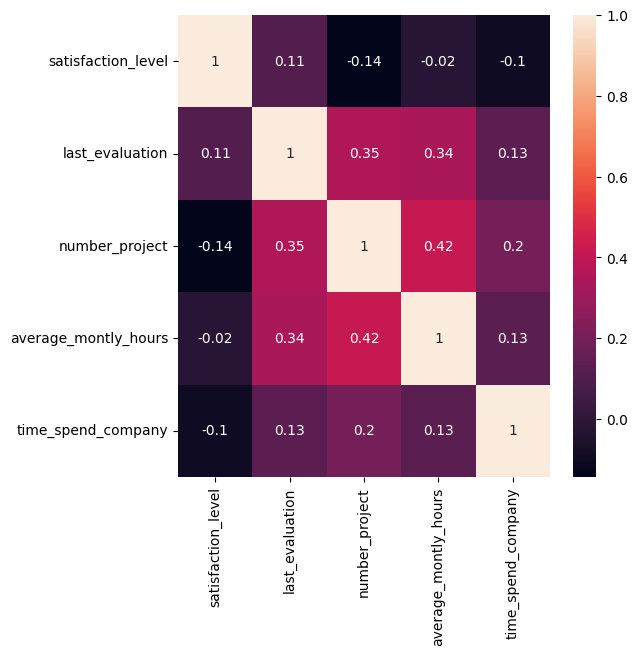

In [ ]:
# La matriz de correlación de las varaibles numéricas nos indica que no se
# observan correlaciones altas entre ellas, es decir, se tiene una
# multicolinealidad baja:

correlations = df_Tnum[num_list].corr()
f, ax = plt.subplots(figsize = (6,6))
sns.heatmap(correlations, annot = True);

# **KPrototype : KMeans para variables numéricas y categóricas.**



#### **Recordemos que KMeans es una técnica para variables numéricas ya que está basada en la distancia (por ejemplo, euclideana) entre puntos. Para el caso de variables categóricas, dicha "distancia" será ahora la Moda y la similitud será la diferencia entre los distintos niveles.**

#### **Para ello debemos usar la librería KModes para datos solamente categóricos, o bien KPrototype, para conjunto de datos mixtos (numéricos y categóricos).**

#### **Toma en cuenta que debido al proceso de estar manejando variables numéricas y categóricas, el método de KPrototype puede tomar varios minutos en terminarse.**

In [ ]:
!pip install kmodes   # Debemos instalar KModes, que necesitaremos para KPrototype.

In [ ]:
from kmodes.kprototypes import KPrototypes

In [ ]:
df_Tnum.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


Vemos la información de las variables categóricas:

In [ ]:
df_Tnum['Work_accident'].value_counts()

0    12831
1     2169
Name: Work_accident, dtype: int64

In [ ]:
df_Tnum['promotion_last_5years'].value_counts()

0    14681
1      319
Name: promotion_last_5years, dtype: int64

In [ ]:
df_Tnum['sales'].value_counts()

sales          4141
technical      2720
support        2229
IT             1227
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Name: sales, dtype: int64

In [ ]:
df_Tnum['salary'].value_counts()

low       7317
medium    6446
high      1237
Name: salary, dtype: int64

#### **Método de inicialización de KModes y KPrototype:**

Existen varias técnicas de inicialización de las variables catagóricas, en particular usaremos la llamada "Huang", la cual selecciona los primeros "K" registros distintos para iniciar con "K-Modes". Recordemos que en KModes se utuliza la moda en lugar del promedio aritmético que se aplica en las numéricas.

La "distancia" o "diferencia" entre un dato y un centroide será la suma de la diferencia de la parte numérica más la parte categórica. La parte numérica se calcula con la distancia euclideana usual sobre las coordenadas numéricas. Y la parte categórica mide la distancia de un dato a un centroide, como la cantidad de coordenadas categóricas diferentes dentre el dato y el centroide.

Las variables categóricas no requieren ser transformadas, solamente hay que indicar cuáles son y el algoritmo se encargará de tratarlas como tales.

Puedes consultar la siguiente liga de la documentación:

https://kprototypes.readthedocs.io/en/latest/api.html

In [ ]:
# Apliquemos el método de KMeans para datos mixtos (numéricos y categóricos)

#                                                            ...esta celda tarda 45 mins aprox en Google-Colab ...

ssecat = []    # Suma del cuadrado de los errores numéricos y categóricos .

k_list = range(1, 11)

cat_cols = [5,6,7,8]  # cat_list

for k in k_list:
    kp = KPrototypes(n_clusters=k, init='Huang', n_init=5,max_iter=10,verbose = 0)    # Inicializamos KMeans-con-varaibles-Mixtas
    kp.fit(df_Tnum , categorical=cat_cols)     # debemos indicarle cuáles son las variables categóricas.
    ssecat.append([k, kp.cost_])   # Calculamos la incercia de cada dato, numérica y categórica conjunta.


oca_results_scale = pd.DataFrame({'Cluster': range(1,11), 'SSE-CAT': ssecat})

plt.figure(figsize=(6,3))
plt.plot(pd.DataFrame(ssecat)[0], pd.DataFrame(ssecat)[1], marker='o')
plt.title('Método del Codo con datos Numéricos y Categóricos')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')

# **Ejercicio - 1:**

In [ ]:
# Selecciona el valor del entero "k" de kMeans, la cantidad de subgrupos o
# cúmulos (clusters) que creas adecuado siguiendo la técnica del codo
# y de acuerdo a la gráfica obtenida en la celda anterior:


# ************* Inlcuye aquí tu código:*****************************


ssecat = []

# Definir el rango de valores k a probar
k_list = range(1, 11)

# Ejecutar K-Prototypes para cada valor de k y almacenar el costo (inercia)
for k in k_list:
    kp = KPrototypes(n_clusters=k, init='Huang', n_init=2, verbose=0,max_iter=10)
    kp.fit(df_Tnum, categorical=cat_cols)
    ssecat.append([k, kp.cost_])

# Convertir los resultados en un DataFrame para facilitar la visualización
oca_results_scale = pd.DataFrame(ssecat, columns=['Cluster', 'SSE-CAT'])

# Crear la gráfica del método del codo
plt.figure(figsize=(6,3))
plt.plot(oca_results_scale['Cluster'], oca_results_scale['SSE-CAT'], marker='o')
plt.title('Método del Codo con datos Numéricos y Categóricos')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')

plt.show()




In [42]:
k_clusters_KProto = 5

In [43]:
# Asumiendo que 'ssecat' contiene la inercia para cada valor de k
inercias = [cost for _, cost in ssecat]

# Encontrar el 'codo' en el gráfico de inercia
k_clusters_KProto = None
for i in range(1, len(inercias) - 1):
    # Calcula la diferencia en la inercia
    diff1 = inercias[i - 1] - inercias[i]
    diff2 = inercias[i] - inercias[i + 1]

    # Si la diferencia cambia significativamente, podemos estar en el 'codo'
    if diff1 > diff2:
        k_clusters_KProto = i + 1  # +1 porque los índices en Python empiezan en 0
        break

# Si k_clusters_KProto sigue siendo None, podríamos establecer un valor predeterminado o revisar la gráfica manualmente
if k_clusters_KProto is None:
    k_clusters_KProto = 4  # O cualquier otro valor que parezca razonable según la gráfica

k_clusters_KProto


4

Recordemos que el Autoencoder es una red neuronal artificial, por lo que ahora sí requerimos transformar también las variables categóricas.

In [44]:
# Escalando la variable Ordinal:

df_Tnumord = df_Tnum.copy()

ordenc = OrdinalEncoder()
df_Tnumord[['salary']] = ordenc.fit_transform(df_Tnumord[['salary']])

df_Tnumord.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,1.0,1.0,2.0,2.0,1.0


Las variables binarias las dejaremos como tales y la nominal aplicaremos one-hot-encoding con el método get_dummies() de Pandas:

In [45]:
X_Tnumordnom = df_Tnumord.copy()   # transformemos la variable Nominal con las Dummies de Pandas.

X_Tnumordnom = pd.get_dummies(X_Tnumordnom, columns=['sales'], drop_first=True)

df_Tnumordnom = pd.DataFrame(X_Tnumordnom)

print(df_Tnumordnom.shape)
df_Tnumordnom.head().T

(15000, 17)


,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.899170
number_project,-1.462710,-1.462710,0.971174,2.593762,0.971174
average_montly_hours,-2.103090,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0.000000,0.000000,0.000000,0.000000,0.000000
promotion_last_5years,0.000000,0.000000,0.000000,0.000000,0.000000
salary,1.000000,1.000000,2.000000,2.000000,1.000000
sales_RandD,0.000000,0.000000,0.000000,0.000000,0.000000
sales_accounting,0.000000,0.000000,0.000000,0.000000,0.000000


# **Modelo AUTOENCODER**

In [46]:
# Definamos una arquitectura Autoencoder de manera usual para el caso de
# búsqueda de conglomerados: iniciar en el Encoder incrementando las primeras
# capas densas ocultas para deshacer lo mayor posible la dependencia de los
# factores, para posteriormente proyectarlos al espacio latente Z de menor
# dimensión. Cuando decimos de menor dimensión, es con respecto a la dimensión
# de los factores de entrada. En particular usaremos aproximadamente la mitad
# de los nodos/factores de entrada (que son 17).
# Posteriormente el Decoder será un espejo del
# Encoder, salvo alguna capa que podemos eliminar para que no se tenga una
# simetría completa y obtengamos algo más que simplemente vectores muy
# similares a los iniciales de entrada.
# Cada capa densa la inicializamos con Xavier-Glorot y usamos ReLU como
# función de activación.
# Finalmente usamos Adam como optimizador y la suma de cuadrados para la
# función de costo.

input_factors = df_Tnumordnom.shape[1]  # cantidad de factores en los datos de entrada.
int_z_latent = 8     # Dimensión del espacio latente Z.
encoding_dim = k_clusters_KProto  # valor k que determinaste en el método del codo del Ejercicio 1.

input_df = Input(shape=(input_factors, ))

# Capas del ENCODER:
x = Dense(encoding_dim, activation='relu')(input_df)
x = Dense(400, activation='relu', kernel_initializer='glorot_uniform')(x)
x = Dense(400, activation='relu', kernel_initializer='glorot_uniform')(x)
x = Dense(1500, activation='relu', kernel_initializer='glorot_uniform')(x)

# ESPACIO LATENTE Z:
encoded = Dense(int_z_latent, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)

# Capas del DECODER:
x = Dense(1500, activation = 'relu', kernel_initializer = 'glorot_uniform')(encoded)
x = Dense(400, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)

decoded = Dense( input_factors, kernel_initializer = 'glorot_uniform')(x)

# Generamos los modelos Autoencoder y Encoder:
autoencoder = Model(input_df, decoded)  # Modelo Autoencoder: (entrada de datos iniciales) + (Encoder) + (espacio-Z-latente) + (Decoder).
encoder = Model(input_df, encoded)      # Modelo Encoder:  (entrada de datos iniciales) + (Encoder) + (espacio-Z-latente).

autoencoder.compile(optimizer = 'adam', loss = 'mean_squared_error')

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Pasamos al proceso de entrenamiento del Autoencoder.
# Aunque solo requeriremos en este ejercicio el Encoder, en el proceso debemos
# también generar el Decoder:

autoencoder.fit(df_Tnumordnom, df_Tnumordnom, batch_size=256, epochs = 30, verbose = 1)


Epoch 1/30
59/59 [==============================] - 14s 129ms/step - loss: 0.2846
Epoch 2/30
59/59 [==============================] - 6s 102ms/step - loss: 0.2114
Epoch 3/30
59/59 [==============================] - 6s 98ms/step - loss: 0.1887
Epoch 4/30
59/59 [==============================] - 3s 55ms/step - loss: 0.1730
Epoch 5/30
59/59 [==============================] - 3s 55ms/step - loss: 0.1618
Epoch 6/30
59/59 [==============================] - 4s 75ms/step - loss: 0.1528
Epoch 7/30
59/59 [==============================] - 3s 55ms/step - loss: 0.1437
Epoch 8/30
59/59 [==============================] - 3s 55ms/step - loss: 0.1359
Epoch 9/30
59/59 [==============================] - 3s 58ms/step - loss: 0.1286
Epoch 10/30
59/59 [==============================] - 4s 71ms/step - loss: 0.1218
Epoch 11/30
59/59 [==============================] - 3s 55ms/step - loss: 0.1171
Epoch 12/30
59/59 [==============================] - 3s 55ms/step - loss: 0.1131
Epoch 13/30
59/59 [===============

In [47]:
pred_Z_latente = encoder.predict(df_Tnumordnom)   # generamos los vectores en el espacio latente Z a la salida del Encoder.

469/469 [==============================] - 2s 4ms/step


In [48]:
pred_Z_latente.shape   # dimensión de los vectores en el espacio latente

(15000, 8)

Ahora, con base a los vectores latentes obtenidos con el Autoencoder, apliquemos kMeans (con el método usual para variables numéricas) para seleccionar cuántos cúmulos podríamos generar con estos vectores para obtener información sobre los empleados de la empresa y su potencial salida de la misma.

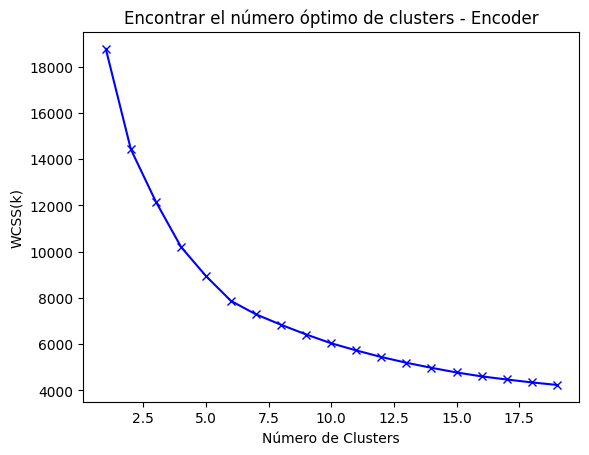

In [49]:
scores_Z = []                                          #    tarda menos de 1 min

range_values = range(1,20)

for i in range_values:
    kmeans = KMeans(n_clusters = i, n_init=10)
    kmeans.fit(pred_Z_latente)
    scores_Z.append(kmeans.inertia_)   # WCSS : within-cluster sum of square


plt.plot(range_values, scores_Z, 'bx-')
plt.title("Encontrar el número óptimo de clusters - Encoder")
plt.xlabel("Número de Clusters")
plt.ylabel("WCSS(k)")
plt.show()

Basándonos en el método del codo, podríamos decir que 5, 6 o 7 cúmulos serían adecuados.

Veamos que valor de K obtenemos con la técnica Silhouette.

Si no conoces esta técnica, puedes consultar la documentación correspondiente en la siguiente liga:

https://www.scikit-yb.org/en/latest/api/cluster/silhouette.html


In [50]:
from yellowbrick.cluster import SilhouetteVisualizer

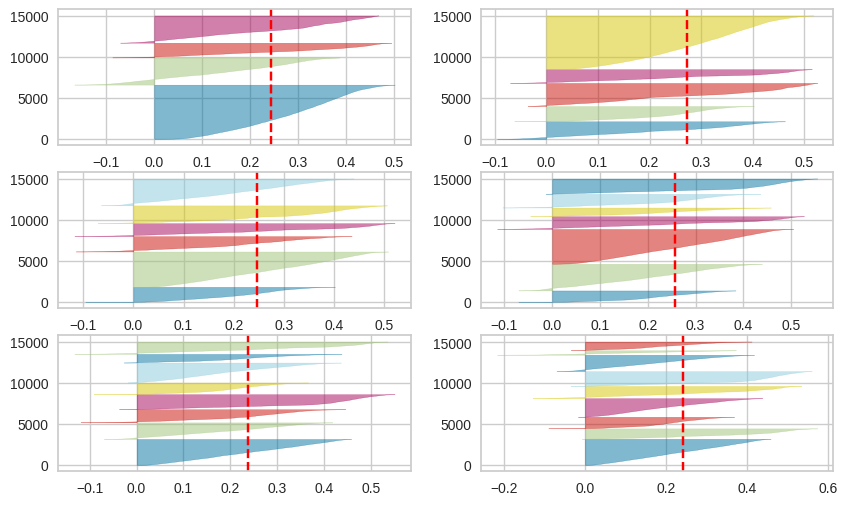

In [51]:
fig, ax = plt.subplots(3, 2, figsize=(10,6))            # tarda se 1 a 2 mins

for i in [4,5,6,7,8,9]:
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=7)
    q, mod = divmod(i-2, 2)

    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(pred_Z_latente)

# **Ejercicio - 2:**

In [57]:
# Selecciona el valor del entero "k" del número de cúmulos con base a lo
# observado los gráficoa de la técnica del codo y de silhouette.
# Observa que no necesriamente deben coincidir los valores observados
# por ambos métodos, por lo que deberás elegir el que consideres
# más adecuado:


# ************* Inlcuye aquí tu código:*****************************


k_clusters_Z_latente = 4



# *********** Aquí termina la sección de agregar código *************


In [58]:
km_Z_latent = KMeans(n_clusters= k_clusters_Z_latente,    # valor que seleccionaste en el Ejercicio 2.
                     n_init=10,    # número de veces que selecciona vectores de inicialización y se queda con el de menor inercia.
                     max_iter=500,
                     init='k-means++').fit(pred_Z_latente)

labels_Z_latent = km_Z_latent.labels_    # etiquetas para cada registro-renglón de los datos de entrada.

In [59]:
pd.DataFrame(labels_Z_latent).value_counts()   # Tamaño de los clusters obtenidos con el método del Autoencoder.

0    6608
2    3311
3    3302
1    1779
dtype: int64

In [60]:
# Apliquemos PCA ahora a los vectores latentes obtenidos para proyectarlos y
# visualizarlos en un espacio de dimensión 2:

pca = PCA(n_components=2)
princ_comp = pca.fit_transform(pred_Z_latente)
pca_df = pd.DataFrame(data = princ_comp, columns=["pca1", "pca2"])
pca_df = pd.concat([pca_df, pd.DataFrame({"cluster":labels_Z_latent})], axis = 1)
pca_df.head(3)

,pca1,pca2,cluster
0,-1.215446,0.012189,2
1,-1.122982,0.104234,2
2,1.308789,-0.018726,3


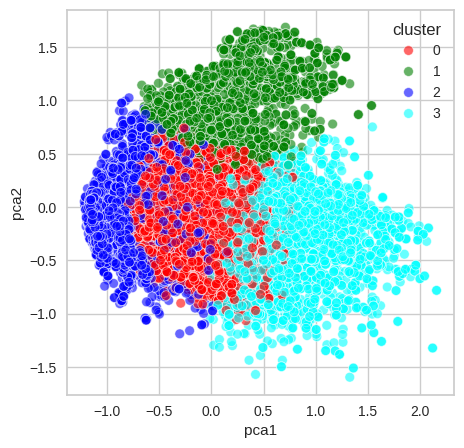

In [61]:
plt.figure(figsize=(5,5))
ax = sns.scatterplot(x="pca1", y = "pca2", hue="cluster", data = pca_df,
                     alpha=0.6,
                     palette=["red", "green", "blue","cyan", "black",'pink','orange', "yellow"])
plt.show()

In [62]:
# Concatenamos la información de las etiquetas de cada registro del dataframe de
# entrada indicando además en qué cúmulo se encuentran.
# Es importante tener los valores iniciales sin transformar con la información
# de a qué cumulo pertenece para poder darles un mejor significado desde el
# punto de vista del negocio, en este caso sobre cada factor y su impacto en
# la posible salida de un empleado.

cluster_Z_latent_perfiles = pd.concat([dftodos, pd.DataFrame({'autoencoder_clusters':labels_Z_latent})], axis=1 )

cluster_Z_latent_perfiles.head().T

,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low
autoencoder_clusters,2,2,3,1,3


# **PCA - Análisis de Componentes Principales**



Aplicaremos ahora la técnica PCA a los datos iniciales para generar igualmente cúmulos y compararlo con lo obtenido con la técnica de Autoencoder previamente vista. Esta técnica es más conocida y generalemente la que se aplica en primera instancia en un problema de agrupamiento (clustering).

En este caso lo haremos tomando directamente las decisiones sobre los gráficos que estarmos generando:

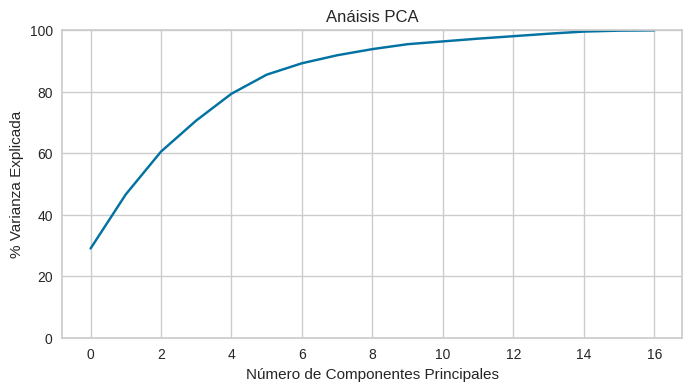

In [63]:
# Consideremos el DataFrame con los 17 vectores transformados
# y apliquemos PCA con todos ellos para ver qué cantidad de
# componenes principales podrían ser suficientes para un análisis
# de relación factores y cúmulos que formaremos:

pca = PCA(n_components= df_Tnumordnom.shape[1], random_state=5)
pca.fit(df_Tnumordnom)

variance = pca.explained_variance_ratio_
var = np.cumsum(np.round(variance, 3)*100)

plt.figure(figsize=(8,4))
plt.ylabel('% Varianza Explicada')
plt.xlabel('Número de Componentes Principales')
plt.title('Anáisis PCA')
plt.ylim(0,100.1)
plt.plot(var);

#### **Vemos que con 4 o 6 componentes principales se explica aproximadamente entre el 80% y 90% de su varianza.**

#### **Selecconaremos el valor de 6 componentes principales (que implica cerca del 90% de la variabilidad de los datos) para fines de este ejercicio y a continuación veamos cuántos cúmulos podrían ser adecuados usar al aplicar el método de conglomerados (clustering).**

Text(0, 0.5, 'Inercia')

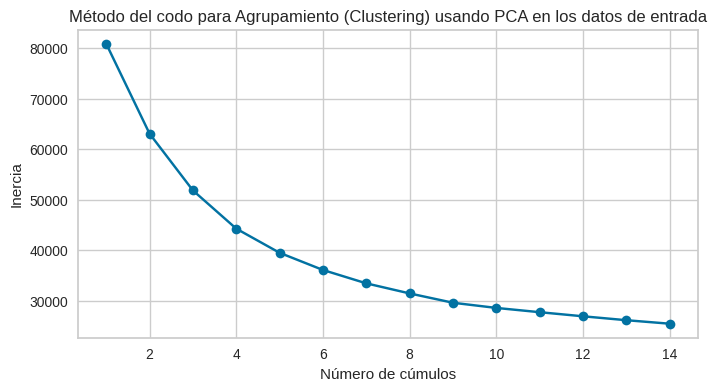

In [64]:
                                                            #  tarda menos de 1 min
pca = PCA(n_components=6)    # seleccionamos 6 componentes principales que tienen un 90% de la varibilidad total
pca_T = pca.fit_transform(df_Tnumordnom)
pca_df_T = pd.DataFrame(pca_T, columns=['pc1','pc2','pc3','pc4','pc5','pc6'])


sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k,n_init=7,random_state=7)
    km.fit(pca_df_T)
    sse.append([k, km.inertia_])

pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(8,4))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Método del codo para Agrupamiento (Clustering) usando PCA en los datos de entrada')
plt.xlabel('Número de cúmulos')
plt.ylabel('Inercia')

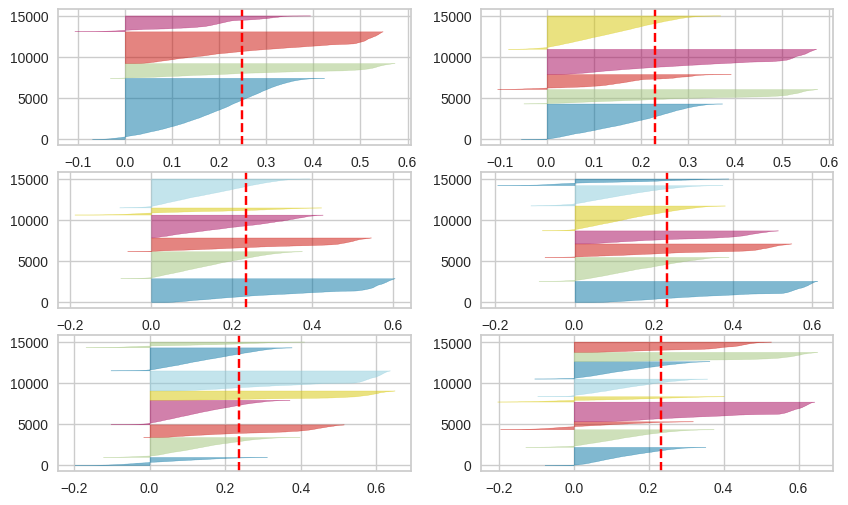

In [65]:
# Veamos también el método Silhouette a ver que nos dice:

fig, ax = plt.subplots(3, 2, figsize=(10,6))                            # tarda como 1 min

for i in [4,5,6,7,8,9]:
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=7)
    q, mod = divmod(i-2, 2)

    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(pca_df_T)

De ambos análisis/gráficos observamos varias opciones, pero para fines de este ejercicio seleccionaremos el valor de 5 para la cantidad de cúmulos que consideamos más adecuada con estos 6 vectores de componentes principales que generamos.

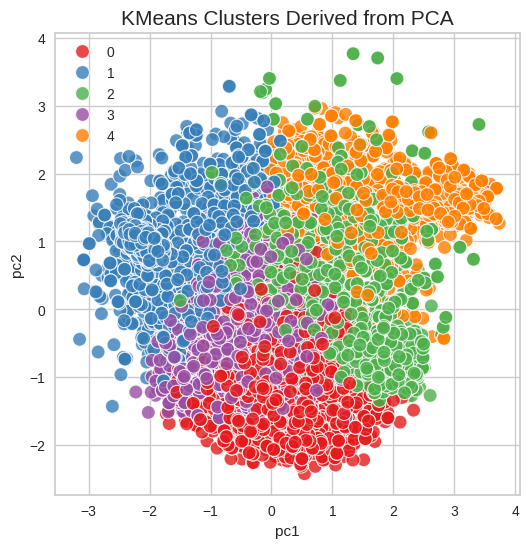

In [66]:
kmeans_pca_T = KMeans(n_clusters=5, n_init=7, max_iter=400, init='k-means++').fit(pca_df_T)

labels_pca_T = kmeans_pca_T.labels_

clusters_pca_T = pd.concat([pca_df_T, pd.DataFrame({'pca_clusters':labels_pca_T})], axis=1)



# Grafiquemos las primeras 2 componentes principales del método PCA :
plt.figure(figsize = (6,6))
sns.scatterplot(x=clusters_pca_T['pc1'],
                y=clusters_pca_T['pc2'],
                hue=labels_pca_T,
                palette='Set1',
                s=100,
                alpha=0.8
                ).set_title('KMeans Clusters Derived from PCA', fontsize=15)

plt.legend()
plt.show()

In [67]:
# Concatenamos ahora el dataFrame de datos originales con los cúmulos identificados
# mediante las componentes principales de los datos de entrada:

cluster_pca_perfiles = pd.concat([dftodos, pd.DataFrame(clusters_pca_T['pca_clusters'])], axis=1 )
cluster_pca_perfiles.head().T

,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low
pca_clusters,1,1,2,4,2


# **Relaciones entre factores de acuerdo a los cúmulos**

<Figure size 1500x1000 with 0 Axes>

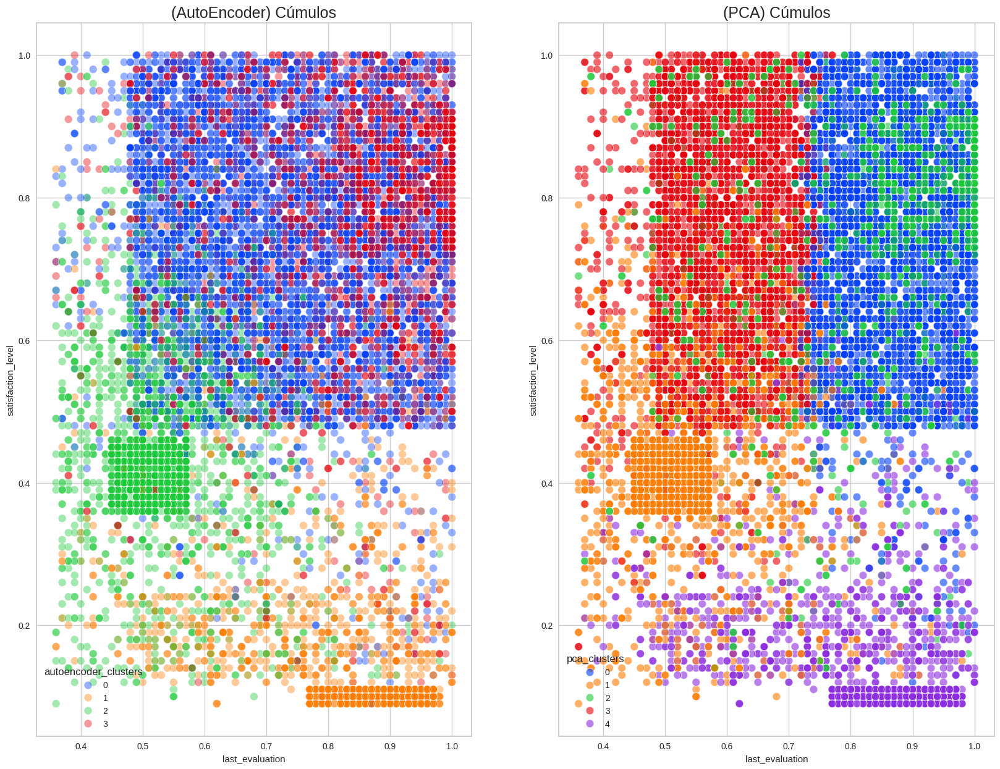

In [68]:
fact1 = 'last_evaluation'
fact2 = 'satisfaction_level'

mi_scatterplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

In [69]:
box = (cluster_Z_latent_perfiles['last_evaluation'] < 0.56 ) & (cluster_Z_latent_perfiles['last_evaluation'] > 0.44) & (cluster_Z_latent_perfiles['satisfaction_level'] < 0.47 ) & (cluster_Z_latent_perfiles['satisfaction_level'] > 0.36)

cluster_Z_latent_perfiles[box]

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,sales,salary,autoencoder_clusters
1,0.38,0.53,2,157,3,0,0,sales,low,2
5,0.37,0.52,2,159,3,0,0,sales,low,2
6,0.41,0.50,2,153,3,0,0,sales,low,2
10,0.42,0.53,2,142,3,0,0,sales,low,2
11,0.45,0.54,2,135,3,0,0,sales,low,2
...,...,...,...,...,...,...,...,...,...,...
14989,0.46,0.55,2,145,3,0,0,technical,low,2
14993,0.40,0.48,2,155,3,0,0,support,low,2
14996,0.37,0.48,2,160,3,0,0,support,low,2
14997,0.37,0.53,2,143,3,0,0,support,low,2


# **Ejercicio - 3:**

### **Con base a los gráficos dados en los siguientes pares de factores y en relación a los subgrupos o cúmulos observados por el método de Autoencoders y el de PCA, incluye alguna interpretación del mismo que ayude a entender mejor al departamento de recursos humanos el ambiente de trabajo dentro de la empresa.**

<Figure size 1500x1000 with 0 Axes>

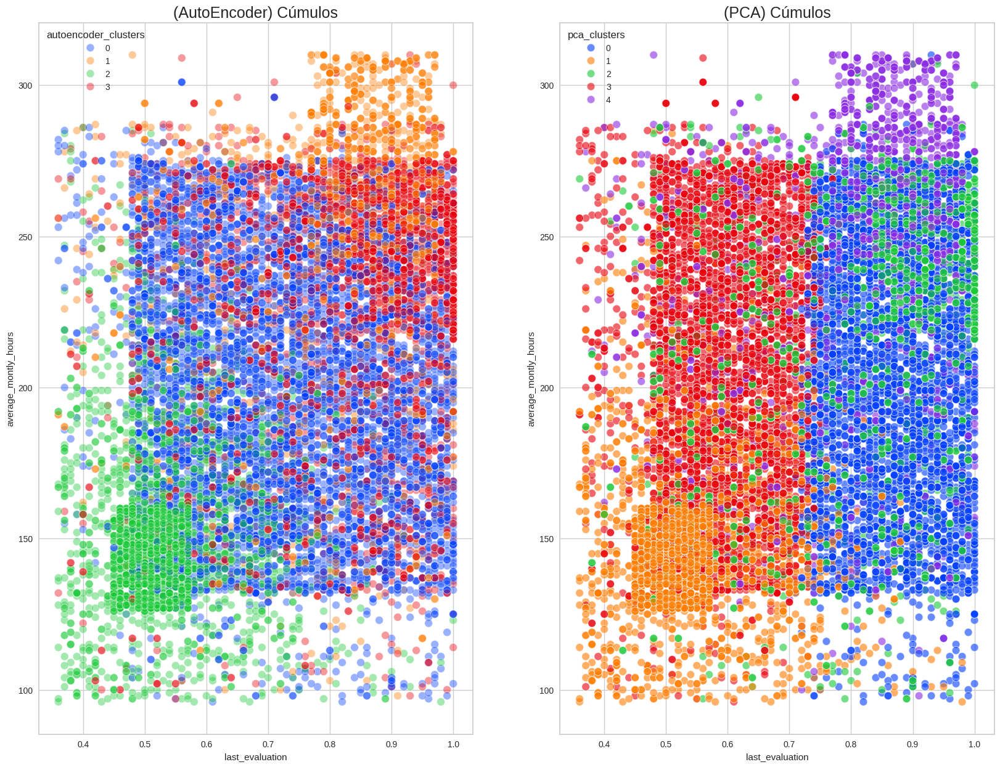

In [70]:
# Ejercicio 3a:


fact1 = 'last_evaluation'
fact2 = 'average_montly_hours'

mi_scatterplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3a:**

++++++++ Inicia la sección de agregar texto: +++++++++++

**Autoencoders Clusters**:

**Se identifican 4 clusters distintos**.
Los clusters se superponen moderadamente, lo que sugiere que hay ciertas características comunes entre los grupos.
Este modelo podría capturar relaciones no lineales y complejas entre las características debido a la naturaleza de los autoencoders.
PCA Clusters:

**Se identifican 5 clusters distintos.**
Hay una separación más clara entre algunos de los clusters, especialmente el verde y el azul, lo que indica diferencias más definidas en cuanto a las características que están siendo observadas.
PCA es una técnica lineal, por lo que los clusters se basan en la variabilidad máxima lineal entre las características.
Interpretación para el Departamento de Recursos Humanos:

Los clusters representan diferentes subgrupos de empleados con **patrones similares** en términos de horas mensuales trabajadas y otro factor no especificado en el eje vertical.
La dispersión en ambos gráficos sugiere diversidad en la experiencia de los empleados, posiblemente relacionada con la satisfacción laboral, el compromiso o la carga de trabajo.

La presencia de diferentes clusters puede indicar grupos con distintos niveles de eficiencia, satisfacción o necesidades de gestión.

**La diferenciación más clara en los clusters del PCA podría ayudar a dirigir las intervenciones de RH hacia grupos específicos, mientras que los clusters de Autoencoder pueden requerir un análisis más profundo para comprender las sutilezas de los patrones complejos.**

++++++++ Termina la sección de agregar texto. +++++++++++

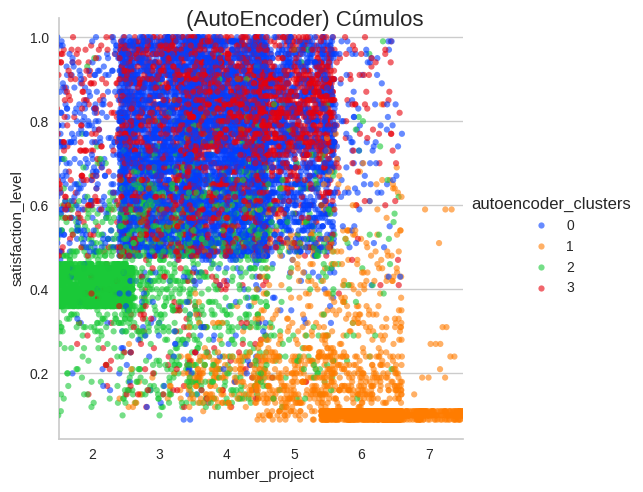

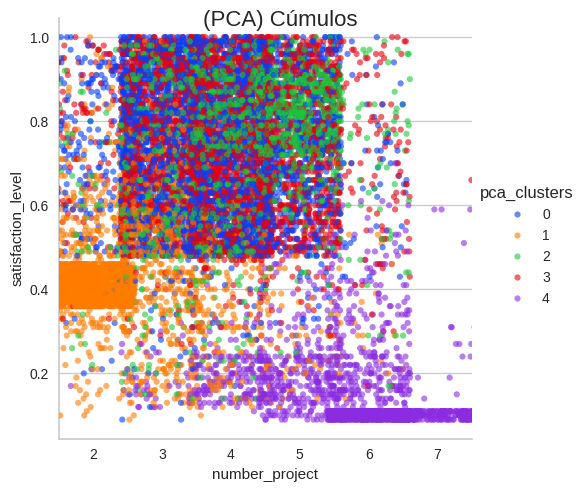

In [71]:
# Ejercicio 3b:


fact1 = 'number_project'
fact2 = 'satisfaction_level'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3b:**

++++++++ Inicia la sección de agregar texto: +++++++++++

En la **visualización de Autoencoders**, observamos cuatro grupos distintos, donde se puede percibir una relación inversa entre el nivel de satisfacción y la cantidad de proyectos: los empleados involucrados en muchos proyectos tienden a tener niveles de satisfacción más bajos. Esto sugiere que una carga de trabajo más alta podría estar asociada con menor satisfacción laboral.

La **visualización de PCA**, por otro lado, presenta cinco clusters y parece tener una mayor mezcla entre los grupos en términos de satisfacción y número de proyectos. A pesar de la superposición, también se puede observar una tendencia similar a la de los Autoencoders con respecto a la relación entre carga de trabajo y satisfacción.

##Interpretación para el departamento de recursos humanos:

1.Satisfacción y carga de trabajo: Ambas técnicas sugieren que la satisfacción del empleado disminuye a medida que el número de proyectos asignados aumenta, lo cual es un indicativo importante para considerar un balance adecuado entre carga de trabajo y bienestar del empleado.

2.Gestión de proyectos: Podría ser beneficioso para la empresa evaluar cómo se asignan los proyectos a los empleados y considerar estrategias para evitar la sobrecarga de trabajo, como la distribución más equitativa de tareas o el incremento de personal en áreas de alta demanda.

3.Bienestar del empleado: Invertir en programas de bienestar del empleado, como actividades de team building, reconocimiento de logros, y apoyo en la gestión del estrés podría ayudar a mejorar los niveles de satisfacción.

++++++++ Termina la sección de agregar texto. +++++++++++

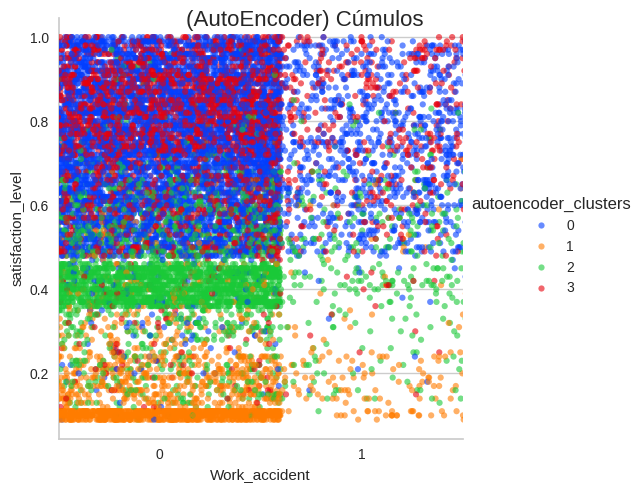

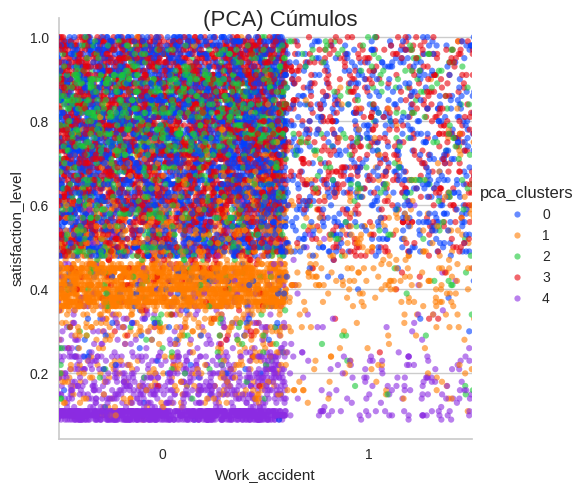

In [72]:
# Ejercicio 3c:


fact1 = 'Work_accident'
fact2 = 'satisfaction_level'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3c:**

++++++++ Inicia la sección de agregar texto: +++++++++++

##Autoencoders:

Los empleados sin accidentes de trabajo están distribuidos en todos los niveles de satisfacción y clusters, lo que sugiere que la satisfacción no está directamente relacionada con la ocurrencia de accidentes.
Sin embargo, parece haber una concentración de empleados con baja satisfacción y sin accidentes de trabajo en un cluster específico (naranja). Esto podría indicar factores de insatisfacción no relacionados con la seguridad.

##PCA:

Similar a Autoencoders, la distribución de los clusters a través de los niveles de satisfacción no muestra una segregación clara con respecto a los accidentes de trabajo.
Un cluster (naranja) parece agrupar a empleados sin accidentes y con niveles bajos de satisfacción, al igual que con Autoencoders, pero con una mayor dispersión.

++++++++ Termina la sección de agregar texto. +++++++++++

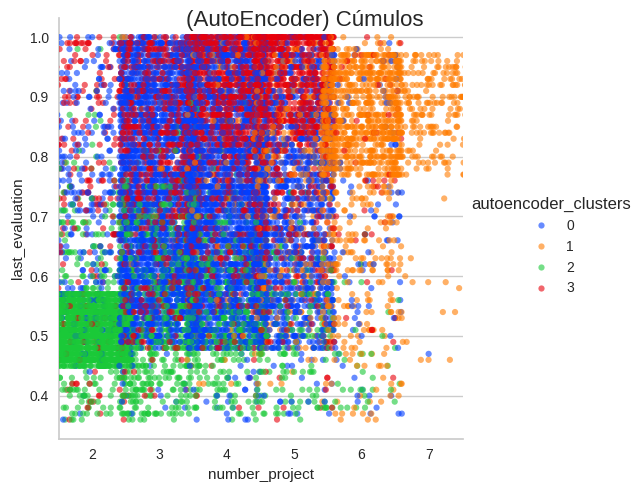

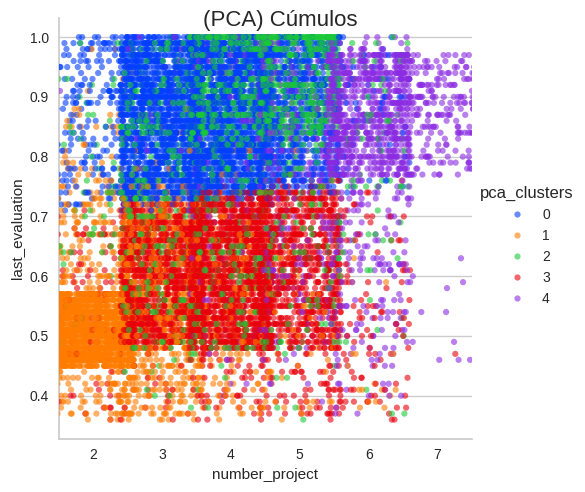

In [73]:
# Ejercicio 3d:

fact1 = 'number_project'
fact2 = 'last_evaluation'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3d:**

++++++++ Inicia la sección de agregar texto: +++++++++++

##Autoencoders:

Los clusters parecen tener una relación directa con la última evaluación: los empleados con evaluaciones más altas están concentrados en la parte superior del gráfico, mientras que aquellos con evaluaciones más bajas se agrupan hacia la parte inferior.
También se aprecia que empleados con más proyectos tienden a tener evaluaciones más altas, lo que puede sugerir que una mayor carga de trabajo está relacionada con un rendimiento más alto, o que los empleados más valorados se les asignan más proyectos.

##PCA:

Aunque los clusters están algo más mezclados que en los resultados de Autoencoders, se observa una tendencia similar en cuanto a la relación entre evaluaciones y número de proyectos.
Sin embargo, existe una mayor superposición de clusters, lo que podría indicar que la reducción de dimensionalidad mediante PCA no separa tan claramente los grupos basados en estas dos características.

##Interpretación :

1.Los resultados pueden indicar que los empleados más comprometidos y con un mayor número de proyectos tienden a recibir evaluaciones más altas, lo cual podría ser un reflejo de su desempeño y dedicación.

2.El departamento de recursos humanos podría usar esta información para considerar estrategias de desarrollo profesional y asignación de proyectos que reconozcan y aprovechen el desempeño de los empleados.

3.Es importante considerar que una alta carga de trabajo no debe traducirse automáticamente en un mayor número de proyectos sin considerar la posibilidad de agotamiento. Se recomienda equilibrar las exigencias del trabajo con el bienestar de los empleados.

++++++++ Termina la sección de agregar texto. +++++++++++

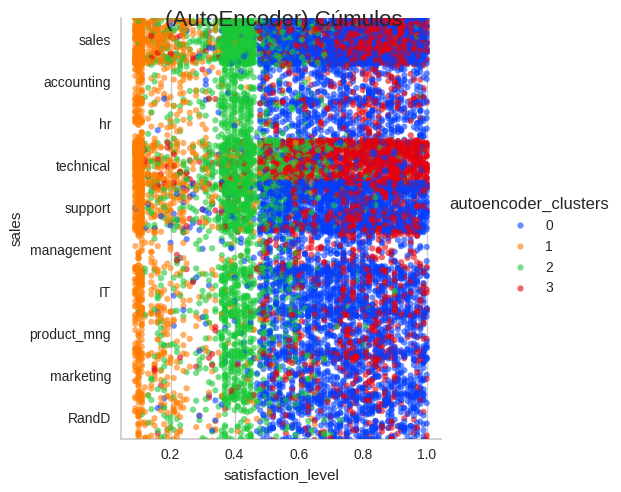

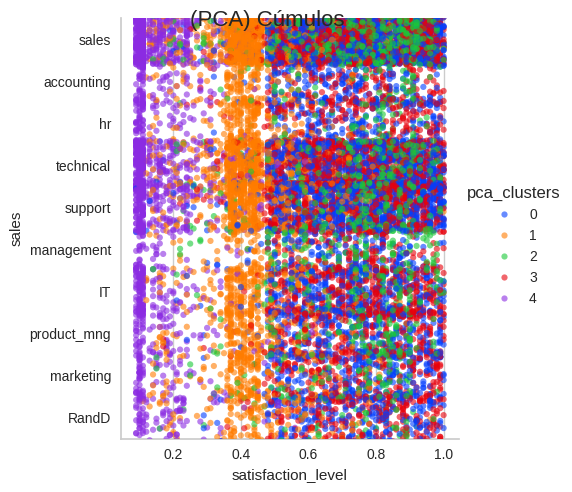

In [74]:
# Ejercicio 3e:

fact2 = 'sales'
fact1 = 'satisfaction_level'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3e:**

++++++++ Inicia la sección de agregar texto: +++++++++++

##Autoencoders:

Los empleados están agrupados en cuatro clusters de manera que parece haber una tendencia clara con respecto al nivel de satisfacción en algunos departamentos. Por ejemplo, en el cluster azul, los empleados de ventas y soporte tienden a tener niveles de satisfacción más altos, mientras que en el cluster naranja, empleados de departamentos como RH y contabilidad parecen menos satisfechos.

##PCA:

Con cinco clusters identificados, la distribución es más mezclada comparada con los Autoencoders. Los clusters no muestran una segregación clara por departamento, lo que sugiere que el nivel de satisfacción está menos asociado con el departamento en esta representación.

##Interpretación resumida:

1.Los resultados podrían indicar que algunos departamentos, como ventas y soporte, podrían tener un mejor ambiente de trabajo o condiciones que conducen a una mayor satisfacción laboral.

2.Los departamentos con empleados menos satisfechos podrían necesitar una evaluación más detallada para identificar y abordar posibles causas de insatisfacción.

3.La diversidad en los niveles de satisfacción dentro de los clusters, especialmente en la visualización de PCA, sugiere que otros factores más allá del departamento pueden influir significativamente en la satisfacción del empleado.

4.El departamento de recursos humanos puede utilizar estos insights para realizar mejoras dirigidas y políticas de apoyo que consideren las particularidades de cada departamento.

++++++++ Termina la sección de agregar texto. +++++++++++

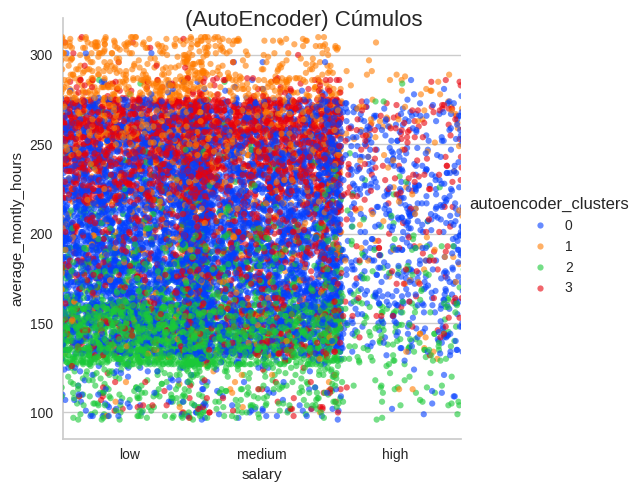

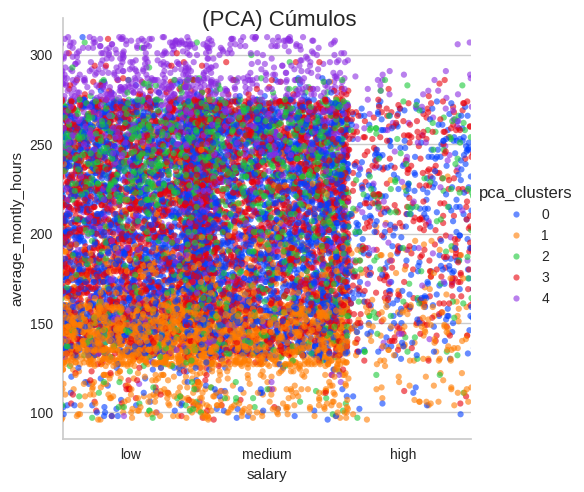

In [75]:
# Ejercicio 3f:


fact1 = 'salary'
fact2 = 'average_montly_hours'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3f:**

++++++++ Inicia la sección de agregar texto: +++++++++++

##Autoencoders:

1.Los clusters no muestran una separación definida basada en los niveles salariales; empleados de todos los rangos salariales parecen estar distribuidos entre los diversos clusters.

2.El cluster azul (0) parece tener una distribución más amplia en términos de horas trabajadas, lo que podría indicar una mayor diversidad en la carga de trabajo independientemente del salario.

3.Los empleados en el rango de salario más bajo parecen estar más concentrados en torno a una carga de trabajo media a alta.

PCA:

1.Al igual que con Autoencoders, no hay una distinción clara entre los niveles salariales entre los clusters.

2.La distribución de las horas trabajadas es también bastante uniforme a través de los niveles salariales, aunque parece haber una ligera concentración de empleados con salarios bajos y altas horas de trabajo en ciertos clusters.

##Interpretación

1.No parece haber una correlación directa entre el salario y las horas trabajadas, lo que sugiere que la compensación no está estrictamente alineada con la cantidad de trabajo.

2.Los departamentos de recursos humanos y de gestión podrían investigar si la estructura de salarios actual refleja adecuadamente la carga de trabajo y las contribuciones de los empleados.

3.Podría ser beneficioso para la empresa revisar las políticas de remuneración y equilibrio laboral-vida personal, especialmente para aquellos empleados en el extremo inferior del espectro salarial con altas horas de trabajo.

++++++++ Termina la sección de agregar texto. +++++++++++

## **Ejercicio 3g:**

In [81]:
cluster_Z_latent_perfiles

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,sales,salary,autoencoder_clusters
0,0.09,0.36,2,96,2,0,0,sales,low,2
1,0.38,0.53,2,157,3,0,0,sales,low,2
2,0.80,0.86,5,262,6,0,0,sales,medium,3
3,0.11,0.88,7,272,4,0,0,sales,medium,1
4,0.72,0.87,5,223,5,0,0,sales,low,3
...,...,...,...,...,...,...,...,...,...,...
14995,0.40,0.57,2,151,3,0,0,support,low,2
14996,0.37,0.48,2,160,3,0,0,support,low,2
14997,0.37,0.53,2,143,3,0,0,support,low,2
14998,0.11,0.96,6,280,4,0,0,support,low,1


In [82]:
cluster_pca_perfiles

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,sales,salary,pca_clusters
0,0.09,0.36,2,96,2,0,0,sales,low,1
1,0.38,0.53,2,157,3,0,0,sales,low,1
2,0.80,0.86,5,262,6,0,0,sales,medium,2
3,0.11,0.88,7,272,4,0,0,sales,medium,4
4,0.72,0.87,5,223,5,0,0,sales,low,2
...,...,...,...,...,...,...,...,...,...,...
14995,0.40,0.57,2,151,3,0,0,support,low,1
14996,0.37,0.48,2,160,3,0,0,support,low,1
14997,0.37,0.53,2,143,3,0,0,support,low,1
14998,0.11,0.96,6,280,4,0,0,support,low,4


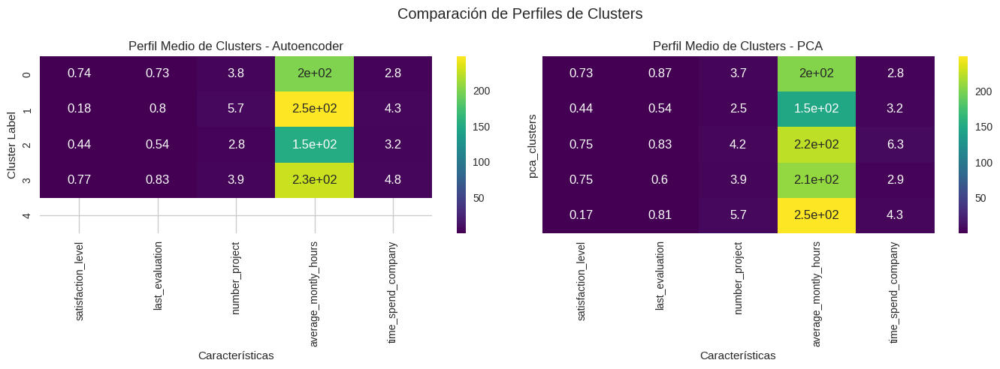

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np



# Calculamos el perfil medio para cada cluster en el DataFrame de Autoencoders
perfil_medio_Z = cluster_Z_latent_perfiles.groupby('autoencoder_clusters').mean()

# Calculamos el perfil medio para cada cluster en el DataFrame de PCA
perfil_medio_pca = cluster_pca_perfiles.groupby('pca_clusters').mean()

# Seleccionamos las características que queremos visualizar, por ejemplo, las primeras 5
caracteristicas = perfil_medio_Z.columns[:5]

# Creamos una figura con subplots para cada conjunto de perfiles de cluster
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# Visualizamos los perfiles medios de clusters para Autoencoders
sns.heatmap(perfil_medio_Z[caracteristicas], ax=axes[0], annot=True, cmap='viridis')
axes[0].set_title('Perfil Medio de Clusters - Autoencoder')
axes[0].set_ylabel('Cluster Label')
axes[0].set_xlabel('Características')

# Visualizamos los perfiles medios de clusters para PCA
sns.heatmap(perfil_medio_pca[caracteristicas], ax=axes[1], annot=True, cmap='viridis')
axes[1].set_title('Perfil Medio de Clusters - PCA')
axes[1].set_xlabel('Características')

plt.suptitle('Comparación de Perfiles de Clusters')
plt.tight_layout()
plt.show()


# Interpretación para Autoencoder:

1.Los clusters parecen diferenciarse principalmente por el número de proyectos y las horas mensuales promedio trabajadas, con el cluster 1 (naranja claro) teniendo valores significativamente más altos en ambas características. Esto podría indicar un grupo de empleados con alta carga de trabajo.

2.Los clusters 0 (púrpura) y 3 (verde) tienen niveles de satisfacción más altos, mientras que el cluster 1 tiene el nivel de satisfacción más bajo. Esto sugiere una posible correlación negativa entre la carga de trabajo y la satisfacción del empleado.

# Interpretación para PCA:

1.La diferenciación de clusters es menos pronunciada, pero aún así se observa que el cluster 4 (amarillo) tiene un alto número promedio de horas trabajadas y el tiempo más largo en la compañía, lo que puede representar empleados con roles más establecidos y exigentes.

2.A pesar de las altas cargas de trabajo, el cluster 4 no tiene los niveles más bajos de satisfacción, lo que podría indicar que otros factores como el tipo de trabajo o las compensaciones adicionales pueden estar influyendo en la satisfacción general.

# Comentarios generales:

1.En ambos métodos, los clusters con menos horas promedio y proyectos tienden a tener mayores niveles de satisfacción, lo que refuerza la idea de que la sobrecarga de trabajo puede afectar negativamente la satisfacción del empleado.

2.La relación entre tiempo en la compañía y satisfacción no es tan clara, lo que sugiere que el compromiso a largo plazo de los empleados podría estar influenciado por una variedad de factores más allá de las métricas de desempeño y carga de trabajo.

3.El departamento de recursos humanos podría utilizar esta información para profundizar en las causas de la insatisfacción en los clusters con baja satisfacción y alta carga de trabajo y explorar maneras de mejorar el equilibrio entre la vida laboral y personal.

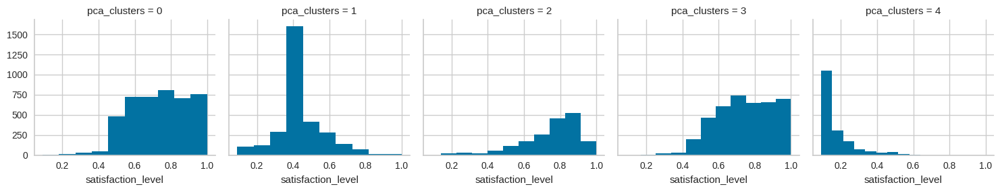

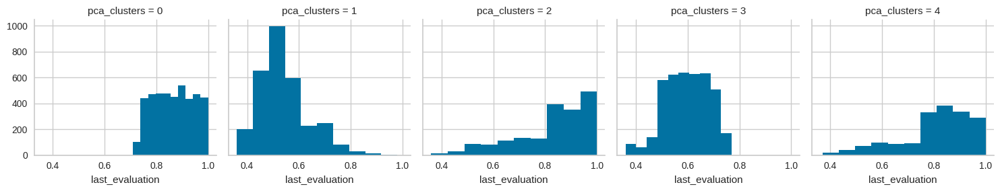

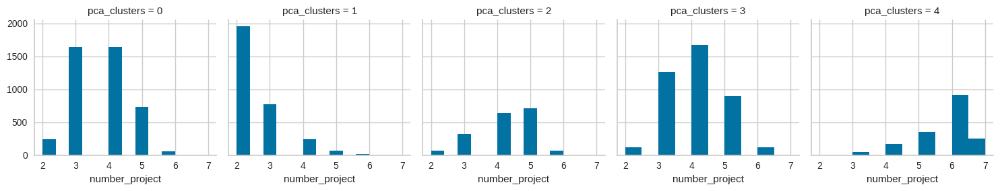

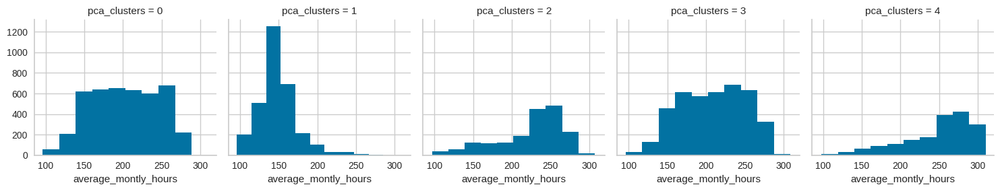

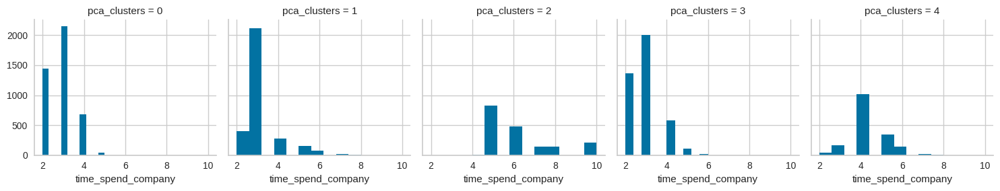

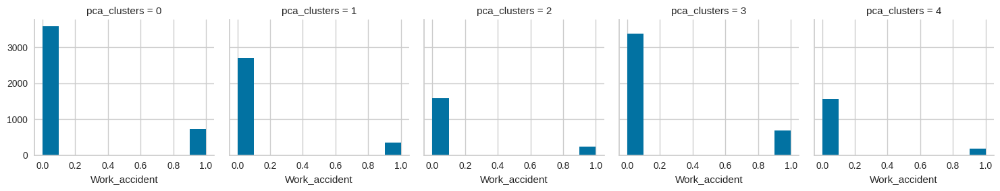

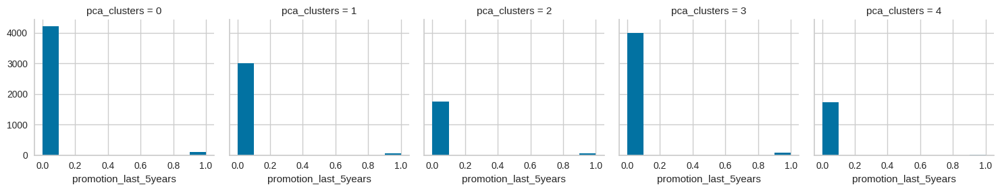

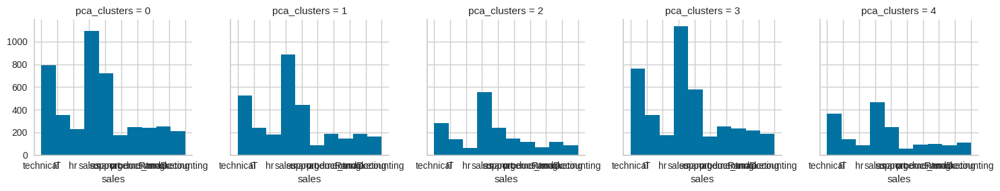

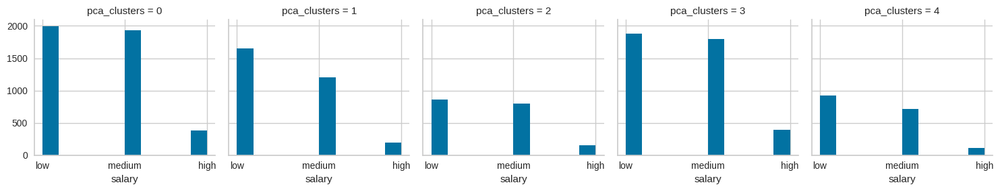

In [76]:
# Podemos obtener algunos diagramas adicionales que nos ayuden a entender
# mejor cada cúmulo y su relación con los factores que la forman.
# Sabemos que exiten una gran variedad de otros tipos e gráficos.
# En particular podemos mostrar los de los cúmulos obtenidos con el método
# de autoencoders solo como muestra y a manera de complemento de la
# información que hemos obtenida con los gráficos anteriores:

for c in cluster_pca_perfiles.iloc[:,:9]:
    grid = sns.FacetGrid(cluster_pca_perfiles, col='pca_clusters')
    grid.map(plt.hist, c)

# **Ejercicio - 4:**

#### **Incluye tus conclusiones y comentarios finales de la Actividad:**

++++++++ Inicia la sección de agregar texto: +++++++++++

Autoencoders:

Han demostrado ser eficaces para capturar estructuras no lineales complejas en los datos.
Los clusters formados por Autoencoders a menudo muestran una separación más clara en términos de las variables estudiadas, como el nivel de satisfacción y la carga de trabajo.
Esta técnica, al ser más flexible, puede resultar en agrupaciones que son más representativas de las verdaderas relaciones entre las características de los datos.
PCA:

Es una técnica de reducción de dimensionalidad lineal que funciona bien cuando las relaciones entre las variables son aproximadamente lineales.
Los clusters identificados por PCA tienden a ser menos definidos que los de Autoencoders, lo que puede dificultar la interpretación de los datos.
PCA es computacionalmente más eficiente y más fácil de interpretar debido a su naturaleza lineal y a la ortogonalidad de sus componentes.

Ambos algoritmos proporcionan perspectivas valiosas, pero cada uno con sus propias fortalezas y limitaciones. Mientras que PCA es útil para una rápida exploración de datos y puede desentrañar patrones lineales, los Autoencoders son más adecuados para capturar complejidades y patrones no lineales en los datos. En un escenario ideal, la combinación de ambos puede proporcionar una comprensión más rica y una imagen más completa del espacio de características subyacente de un conjunto de datos.

++++++++ Termina la sección de agregar texto. +++++++++++

>> **++++ Fin del la Actividad de la Semana de Autoencoders ++++**